# **Judul: Analisis Outlier Limbah Kimia Berbasis Jenis Bahan Berbahaya dan Metode Pengolahan terhadap Sepuluh Fasilitas Industri terbanyak di Amerika Serikat**

# **Kenapa kami memilih topik ini?**

**Latar Belakang**
Pelepasan limbah bahan kimia oleh fasilitas industri merupakan isu krusial dalam perlindungan lingkungan, terutama di negara industri seperti Amerika Serikat. Melalui Toxics Release Inventory (TRI), pemerintah menyediakan data mengenai jenis, jumlah, dan metode pengolahan bahan kimia berbahaya yang dilepaskan ke lingkungan, termasuk zat karsinogenik, PBT, dan PFAS.

Namun, tidak semua pelepasan limbah mengikuti distribusi normal. Terdapat nilai ekstrem (outlier) yang menunjukkan pelepasan bahan kimia dalam jumlah tinggi, yang berpotensi mencerminkan risiko lingkungan signifikan atau ketidakefisienan pengolahan limbah.

Sehingga analisis outlier menjadi penting untuk mendeteksi outlier dari volume pelepasan bahan kimia berdasarkan data TRI, mengidentifikasi fasilitas dengan kontribusi pelepasan yang tidak biasa dan memberikan rekomendasi pengawasan atau mitigasi berdasarkan hasil analisis.

**Ruang Lingkup**
1. Menggunakan data dari Toxics Release Inventory (TRI).
2. Fokus pada 10 fasilitas industri dengan jumlah pelepasan limbah tertinggi di Amerika Serikat.
3. Jenis bahan kimia berbahaya seperti karsionegik, PBT dan PFAS.
4. Jumlah pelepasan on site, offsite, total transfer, total releases hingga production waste.
5. Metode pengolahan limbah off-site treated total, recycling on site dan off site serta treatment on site dan off site.

#**ROADMAP**

# **Input Dataset**
**Input Dataset:** Penginputan dataset ini melalui drive mount google drive yang didalamnya  terdiri dari folder Kelompok-6-Data-Mining dengan file dataset-FORTEX.csv


In [ ]:
#import semua library yang dibutuhkan
import pandas as pd #menampilkan data seolah-olah seperti excel (ada kolom dan barisnya)
import numpy as np # mengolah data numerik dan matriks (array multidimensi)
import matplotlib.pyplot #menampilkan visualisasi
from google.colab import files #mengunggah atau mengunduh file
from google.colab import drive #mengakses file dari Google Drive
import seaborn as sns #mengeksplorasi dan memvisualisasi data lebih advance dari matplotlib

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Path file
file_path = '/content/drive/My Drive/Kelompok-6-Data-Mining/dataset-FORTEX.csv'

# Baca file CSV
data = pd.read_csv(file_path)

# Menampilkan semua baris dan kolom
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Menampilkan data dalam bentuk tabel
data.head(10)  # data akan dirender dalam bentuk tabel di Colab (hanya menampilkan 10 baris teratas)

Mounted at /content/drive


<ipython-input-2-579ab8342aaf>:8: DtypeWarning: Columns (15,18) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path)


,1. YEAR,2. TRIFD,3. FRS ID,4. FACILITY NAME,5. STREET ADDRESS,6. CITY,7. COUNTY,8. ST,9. ZIP,10. BIA,11. TRIBE,12. LATITUDE,13. LONGITUDE,14. HORIZONTAL DATUM,15. PARENT CO NAME,16. PARENT CO DB NUM,17. STANDARD PARENT CO NAME,18. FOREIGN PARENT CO NAME,19. FOREIGN PARENT CO DB NUM,20. STANDARD FOREIGN PARENT CO NAME,21. FEDERAL FACILITY,22. INDUSTRY SECTOR CODE,23. INDUSTRY SECTOR,24. PRIMARY SIC,25. SIC 2,26. SIC 3,27. SIC 4,28. SIC 5,29. SIC 6,30. PRIMARY NAICS,31. NAICS 2,32. NAICS 3,33. NAICS 4,34. NAICS 5,35. NAICS 6,36. DOC_CTRL_NUM,37. CHEMICAL,38. ELEMENTAL METAL INCLUDED,39. TRI CHEMICAL/COMPOUND ID,40. CAS#,41. SRS ID,42. CLEAN AIR ACT CHEMICAL,43. CLASSIFICATION,44. METAL,45. METAL CATEGORY,46. CARCINOGEN,47. PBT,48. PFAS,49. FORM TYPE,50. UNIT OF MEASURE,51. 5.1 - FUGITIVE AIR,52. 5.2 - STACK AIR,53. 5.3 - WATER,54. 5.4 - UNDERGROUND,55. 5.4.1 - UNDERGROUND CL I,56. 5.4.2 - UNDERGROUND C II-V,57. 5.5.1 - LANDFILLS,58. 5.5.1A - RCRA C LANDFILL,59. 5.5.1B - OTHER LANDFILLS,60. 5.5.2 - LAND TREATMENT,61. 5.5.3 - SURFACE IMPNDMNT,62. 5.5.3A - RCRA SURFACE IM,63. 5.5.3B - OTHER SURFACE I,64. 5.5.4 - OTHER DISPOSAL,65. ON-SITE RELEASE TOTAL,66. 6.1 - POTW - TRNS RLSE,67. 6.1 - POTW - TRNS TRT,68. POTW - TOTAL TRANSFERS,69. 6.2 - M10,70. 6.2 - M41,71. 6.2 - M62,72. 6.2 - M40 METAL,73. 6.2 - M61 METAL,74. 6.2 - M71,75. 6.2 - M81,76. 6.2 - M82,77. 6.2 - M72,78. 6.2 - M63,79. 6.2 - M66,80. 6.2 - M67,81. 6.2 - M64,82. 6.2 - M65,83. 6.2 - M73,84. 6.2 - M79,85. 6.2 - M90,86. 6.2 - M94,87. 6.2 - M99,88. OFF-SITE RELEASE TOTAL,89. 6.2 - M20,90. 6.2 - M24,91. 6.2 - M26,92. 6.2 - M28,93. 6.2 - M93,94. OFF-SITE RECYCLED TOTAL,95. 6.2 - M56,96. 6.2 - M92,97. OFF-SITE ENERGY RECOVERY T,98. 6.2 - M40 NON-METAL,99. 6.2 - M50,100. 6.2 - M54,101. 6.2 - M61 NON-METAL,102. 6.2 - M69,103. 6.2 - M95,104. OFF-SITE TREATED TOTAL,105. 6.2 - UNCLASSIFIED,106. 6.2 - TOTAL TRANSFER,107. TOTAL RELEASES,108. 8.1 - RELEASES,109. 8.1A - ON-SITE CONTAINED,110. 8.1B - ON-SITE OTHER,111. 8.1C - OFF-SITE CONTAIN,112. 8.1D - OFF-SITE OTHER R,113. 8.2 - ENERGY RECOVER ON,114. 8.3 - ENERGY RECOVER OF,115. 8.4 - RECYCLING ON SITE,116. 8.5 - RECYCLING OFF SIT,117. 8.6 - TREATMENT ON SITE,118. 8.7 - TREATMENT OFF SITE,119. PRODUCTION WSTE (8.1-8.7),120. 8.8 - ONE-TIME RELEASE,121. PROD_RATIO_OR_ ACTIVITY,122. 8.9 - PRODUCTION RATIO
0,2023,75265BLDNG2600S,1.100244e+11,BMIC LLC,2600 SINGLETON BLVD,DALLAS,DALLAS,TX,75212,NaN,NaN,32.778670,-96.862760,NAD83,G HOLDINGS INC,NaN,G HOLDINGS INC,NaN,NaN,NaN,NO,324,Petroleum,NaN,NaN,NaN,NaN,NaN,NaN,324122,NaN,NaN,NaN,NaN,NaN,1323221961497,Lead And Lead Compounds,YES,N420,N420,650002.0,YES,PBT,YES,Metal complound categories,NO,YES,NO,R,Pounds,0.00,0.26,0.00,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.26,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0,0,0.0,0.0,8463.17,0.0,0.0,0.0,0.0,0.0,0.0,8463.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,8463.17,8463.43,0,0.0,0.26,8463.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8463.43,NaN,PRODUCTION,1.02
1,2023,21922WLGRS1320A,1.100382e+11,W L GORE & ASSOCIATES INC,501 VIEVES WAY,ELKTON,CECIL,MD,21921,NaN,NaN,39.664033,-75.807412,NAD83,W L GORE & ASSOCIATES INC,2331536.0,W L GORE & ASSOCIATES INC,NaN,NaN,NaN,NO,325,Chemicals,NaN,NaN,NaN,NaN,NaN,NaN,325211,NaN,NaN,NaN,NaN,NaN,1323221979659,N-Methyl-2-pyrrolidone,NO,872504,872-50-4,72744.0,NO,TRI,NO,Non_Metal,NO,NO,NO,R,Pounds,1154.76,0.00,0.00,0,0.0,0.0,0,0.0,0.0,0.0,0,0.0,0.0,0.0,1154.76,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,0.0,0,0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,384841.0,0.0,0.0,0.0,0.0,384841.0,0.0,434155.0,434155.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,818996.00,1154.76,0,0.0,1154.76,0.00,0.0,0.0,434155.0,0.0,384841.0,0.0,0.0,820150.76,NaN,ACTIVITY,1.49
2,2023,45449CWMRS4301I,1.100004e+11,VEOLIA N.A. INC.,4301 INFIRMARY RD,WEST CARROLLTON,MONTGOMERY,OH,45449,NaN,NaN,39.683840,-84.275660,NAD83,VEOLIA N.A. INC,81134987.0,VEOLIA NORTH AMERICA,VEOLIA ENVIRONMENNEMENT SA,494763675.0,VEOLIA ENVIRONMENT SA,NO,562,Hazardous Waste,NaN,NaN,Na

# **Pre-Processing Data (Eksplorasi Data)**
**Eksplorasi Data:**
Eksplorasi data dilakukan guna memahami karakteristik, memastikan konsistensi dan kualitas data dari setiap feature dalam dataset fortex secara menyeluruh.

Eksplorasi data yang kami lakukan terdiri dari lima kategori yaitu
1. Eksplorasi Jumlah Baris dan Kolom
2. Ekplorasi Tipe Data
3. Eksplorasi Data Null
4. Eksplorasi Statistik Deskriptif
5. Eksplorasi Data Outlier

In [ ]:
#eksplorasi jumlah baris dan kolom
print("Jumlah baris dan kolom dalam dataset:", data.shape)

Jumlah baris dan kolom dalam dataset: (77964, 122)


In [ ]:
#eksplorasi tipe data
tipe_data = pd.DataFrame({
    "Nama Atribut": data.columns,
    "Tipe Data": data.dtypes.values,
})

#tampilkan tipe data
print(tipe_data)

                            Nama Atribut Tipe Data
0                                1. YEAR     int64
1                               2. TRIFD    object
2                              3. FRS ID   float64
3                       4. FACILITY NAME    object
4                      5. STREET ADDRESS    object
5                                6. CITY    object
6                              7. COUNTY    object
7                                  8. ST    object
8                                 9. ZIP     int64
9                                10. BIA   float64
10                             11. TRIBE    object
11                          12. LATITUDE   float64
12                         13. LONGITUDE   float64
13                  14. HORIZONTAL DATUM    object
14                    15. PARENT CO NAME    object
15                  16. PARENT CO DB NUM    object
16           17. STANDARD PARENT CO NAME    object
17            18. FOREIGN PARENT CO NAME    object
18          19. FOREIGN PARENT 

In [ ]:
#eksplorasi data null
data_null = pd.DataFrame({
    "Nama Atribut": data.columns,
    "Jumlah Data yang Null": data.isnull().sum().values
})

#tampilkan data null
print(data_null)

                            Nama Atribut  Jumlah Data yang Null
0                                1. YEAR                      0
1                               2. TRIFD                      0
2                              3. FRS ID                     19
3                       4. FACILITY NAME                      0
4                      5. STREET ADDRESS                      0
5                                6. CITY                      0
6                              7. COUNTY                      0
7                                  8. ST                      0
8                                 9. ZIP                      0
9                                10. BIA                  77462
10                             11. TRIBE                  77462
11                          12. LATITUDE                      0
12                         13. LONGITUDE                      0
13                  14. HORIZONTAL DATUM                     34
14                    15. PARENT CO NAME

In [ ]:
#eksplorasi statistika deskriptif
statistika_deskriptif = data.select_dtypes(include='number')

#statistik deskriptif: min, median, mean, max, std dev, varians
summary_sd = pd.DataFrame({
    'Minimum': statistika_deskriptif.min(), #Minimum
    'Median': statistika_deskriptif.median(), #Median
    'Mean': statistika_deskriptif.mean(), #Mean
    'Maximum': statistika_deskriptif.max(),#Maximum
    'Std Dev': statistika_deskriptif.std(), #Simpangan baku
    'Variance': statistika_deskriptif.var() #Varians
})

#tampilkan hasil
print("Ringkasan Statistik Kolom Numerik:")
display(summary_sd)


Ringkasan Statistik Kolom Numerik:


,Minimum,Median,Mean,Maximum,Std Dev,Variance
1. YEAR,2.023000e+03,2.023000e+03,2.023000e+03,2.023000e+03,0.000000e+00,0.000000e+00
3. FRS ID,1.100003e+11,1.100054e+11,1.100203e+11,1.100718e+11,2.547560e+07,6.490060e+14
9. ZIP,6.030000e+02,5.276100e+04,7.247880e+06,9.970345e+08,7.089194e+07,5.025667e+15
10. BIA,1.000000e+00,9.050000e+02,7.628247e+02,9.240000e+02,2.435834e+02,5.933288e+04
12. LATITUDE,-1.427092e+01,3.841655e+01,3.753109e+01,7.023395e+01,5.510687e+00,3.036767e+01
13. LONGITUDE,-1.706877e+02,-8.835464e+01,-9.099476e+01,1.457499e+02,1.484259e+01,2.203024e+02
22. INDUSTRY SECTOR CODE,2.110000e+02,3.270000e+02,7.506861e+02,4.247000e+03,1.104842e+03,1.220676e+06
24. PRIMARY SIC,NaN,NaN,NaN,NaN,NaN,NaN
25. SIC 2,NaN,NaN,NaN,NaN,NaN,NaN
26. SIC 3,NaN,NaN,NaN,NaN,NaN,NaN


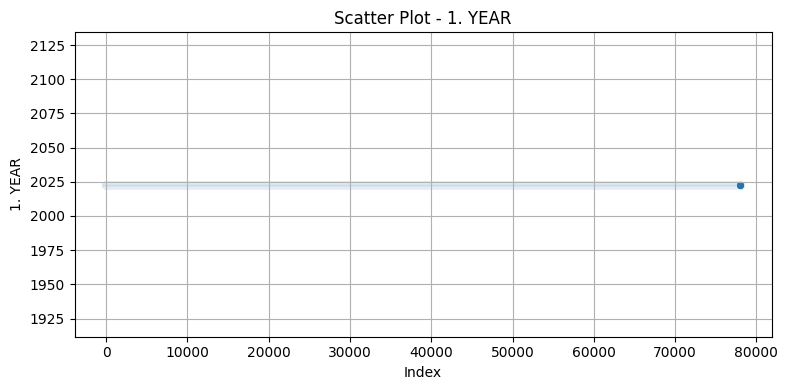

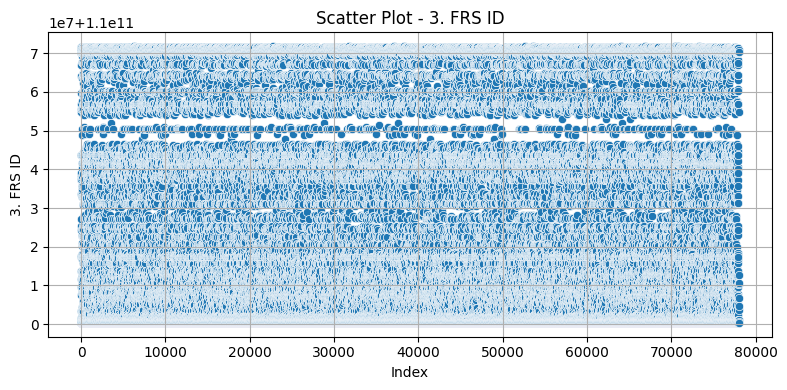

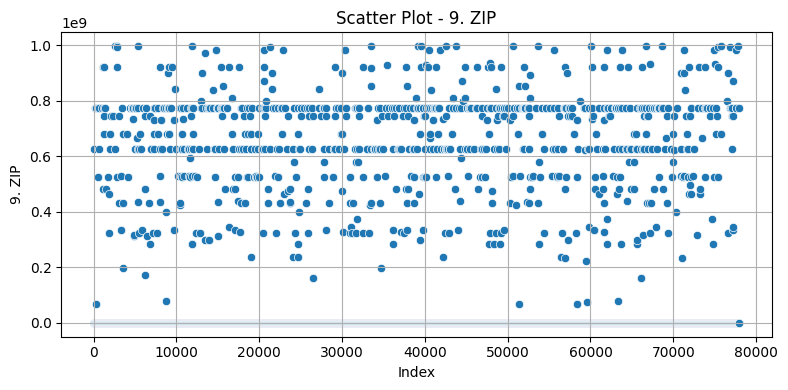

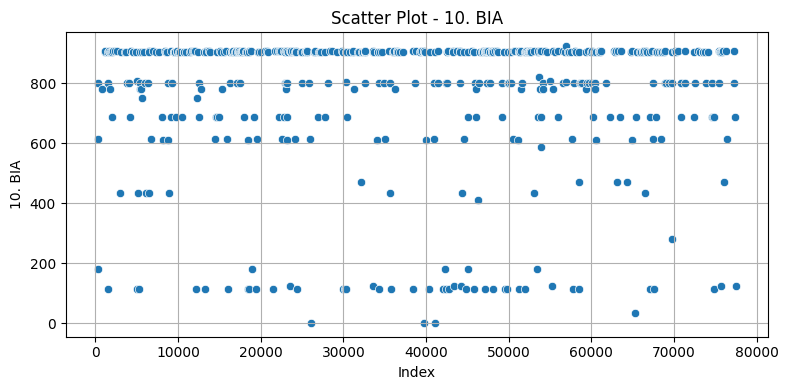

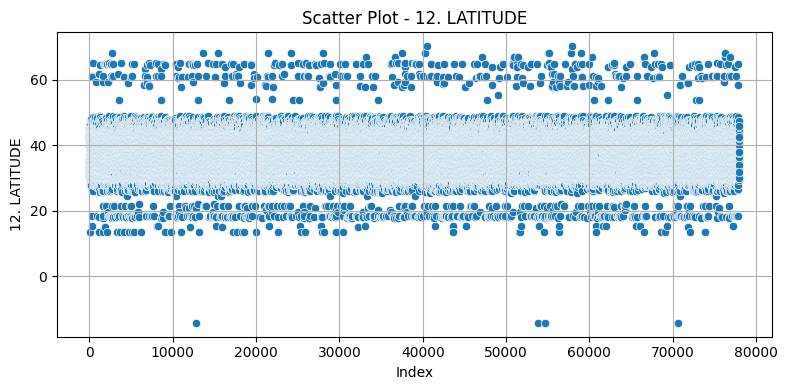

...

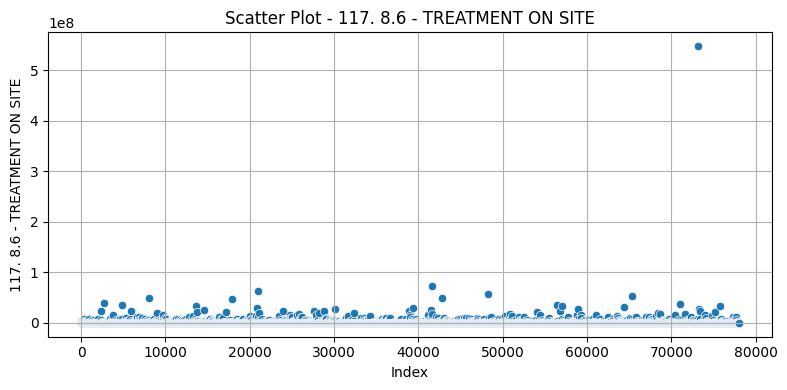

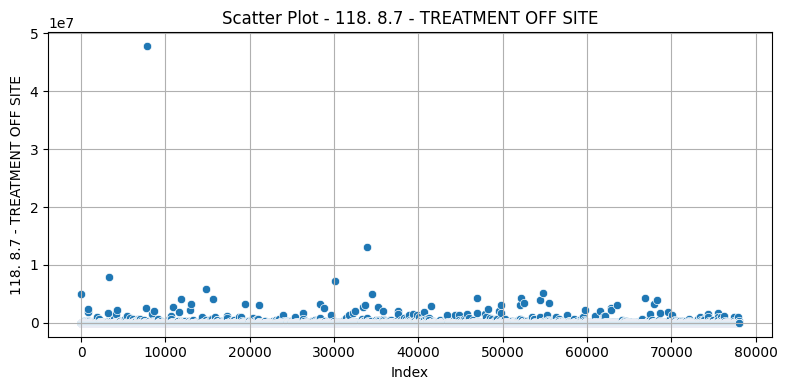

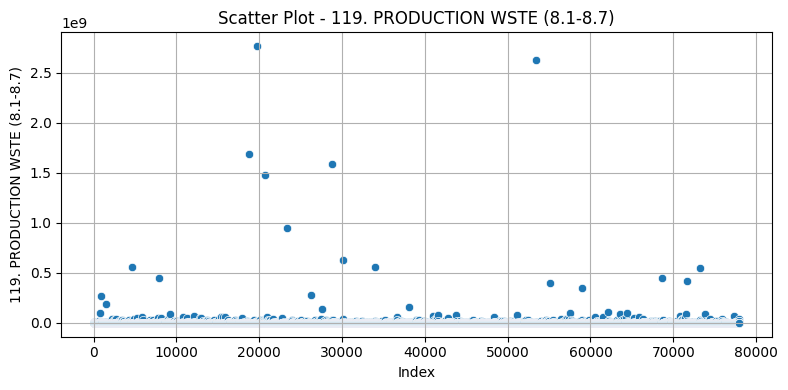

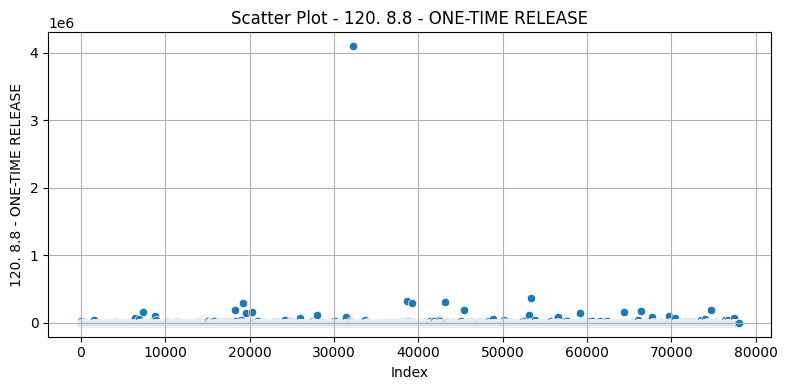

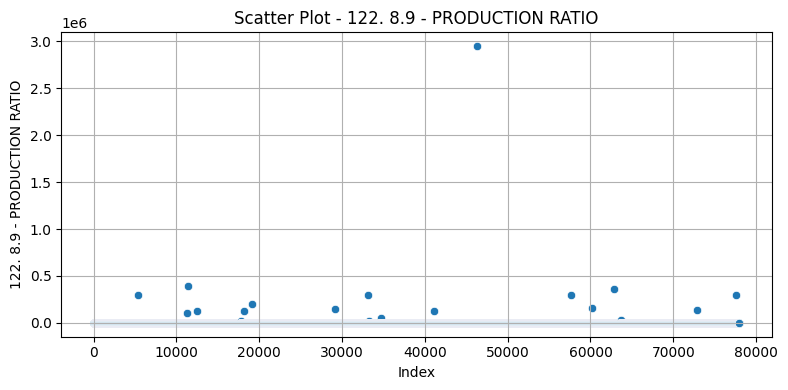

In [ ]:
#eksplorasi data outlier
import seaborn as sns
import matplotlib.pyplot as plt

#ambil hanya kolom numerik
kolom_numerik = data.select_dtypes(include=['int64', 'float64']).columns

#scatter plot per kolom numerik terhadap index baris
for kolom in kolom_numerik:
    plt.figure(figsize=(8, 4))
    sns.scatterplot(x=data.index, y=data[kolom])
    plt.title(f'Scatter Plot - {kolom}')
    plt.xlabel('Index')
    plt.ylabel(kolom)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# **Pre-Processing Data (Features Selection & Data Cleaning)**
**Menghapus attribute** yang tidak relevan terhadap judul penelitian **(features selection)** dengan pertimbangan attributenya bernilai null atau berupa ID (Tidak Memiliki Nilai Prediktif)

**Alasan Nol dalam Data**
1. fasilitas melaporkan NA atau tidak berlaku untuk suatu kuantitas pada formulir R (kuantitas pelepasan atau pengelolaan limbah tidak memungkingkan untuk fasilitas tersebut)
contoh: fasilitas tidak terletak di dekat badan air, tidak dapat melepaskan bahan kimia apapun ke air

2. karena tidak menjawab pertanyaan kuantitas pada formulir R ketika masih pelaporan bentuk kertas
3. laporan fasilitas tidak melebihi 500 pound

In [ ]:
#daftar features dengan yang akan dihapus
features_dihapus = [
    '1. YEAR', '2. TRIFD', '3. FRS ID', '5. STREET ADDRESS','6. CITY','7. COUNTY','43. CLASSIFICATION',
    '10. BIA', '11. TRIBE', '9. ZIP','12. LATITUDE','13. LONGITUDE','14. HORIZONTAL DATUM','62. 5.5.3A - RCRA SURFACE IM',
    '15. PARENT CO NAME', '16. PARENT CO DB NUM', '17. STANDARD PARENT CO NAME','54. 5.4 - UNDERGROUND','58. 5.5.1A - RCRA C LANDFILL',
    '18. FOREIGN PARENT CO NAME', '19. FOREIGN PARENT CO DB NUM', '20. STANDARD FOREIGN PARENT CO NAME',
    '21. FEDERAL FACILITY', '22. INDUSTRY SECTOR CODE','24. PRIMARY SIC', '25. SIC 2', '26. SIC 3', '27. SIC 4', '28. SIC 5', '29. SIC 6',
    '30. PRIMARY NAICS','31. NAICS 2', '32. NAICS 3', '33. NAICS 4', '34. NAICS 5', '35. NAICS 6','36. DOC_CTRL_NUM','38. ELEMENTAL METAL INCLUDED',
    '39. TRI CHEMICAL/COMPOUND ID','40. CAS#','41. SRS ID','44. METAL','45. METAL CATEGORY','49. FORM TYPE', '50. UNIT OF MEASURE',
    '69. 6.2 - M10', '70. 6.2 - M41', '71. 6.2 - M62', '72. 6.2 - M40 METAL', '73. 6.2 - M61 METAL','112. 8.1D - OFF-SITE OTHER R'
    '74. 6.2 - M71', '75. 6.2 - M81', '76. 6.2 - M82', '77. 6.2 - M72', '78. 6.2 - M63','110. 8.1B - ON-SITE OTHER','122. 8.9 - PRODUCTION RATIO',
    '79. 6.2 - M66', '80. 6.2 - M67', '81. 6.2 - M64', '82. 6.2 - M65', '83. 6.2 - M73','68. POTW - TOTAL TRANSFERS',
    '84. 6.2 - M79', '85. 6.2 - M90', '86. 6.2 - M94', '87. 6.2 - M99','64. 5.5.4 - OTHER DISPOSAL','66. 6.1 - POTW - TRNS RLSE','67. 6.1 - POTW - TRNS TRT',
    '89. 6.2 - M20', '90. 6.2 - M24', '91. 6.2 - M26', '92. 6.2 - M28', '93. 6.2 - M93','63. 5.5.3B - OTHER SURFACE I',
    '95. 6.2 - M56', '96. 6.2 - M92', '98. 6.2 - M40 NON-METAL', '99. 6.2 - M50', '100. 6.2 - M54','60. 5.5.2 - LAND TREATMENT','74. 6.2 - M71',
    '101. 6.2 - M61 NON-METAL', '102. 6.2 - M69', '103. 6.2 - M95', '120. 8.8 - ONE-TIME RELEASE','59. 5.5.1B - OTHER LANDFILLS','121. PROD_RATIO_OR_ ACTIVITY',
    '55. 5.4.1 - UNDERGROUND CL I','56. 5.4.2 - UNDERGROUND C II-V','57. 5.5.1 - LANDFILLS','61. 5.5.3 - SURFACE IMPNDMNT','105. 6.2 - UNCLASSIFIED','108. 8.1 - RELEASES',
    '51. 5.1 - FUGITIVE AIR',
    '52. 5.2 - STACK AIR',
    '53. 5.3 - WATER',
    '94. OFF-SITE RECYCLED TOTAL',
    '97. OFF-SITE ENERGY RECOVERY T',
    '109. 8.1A - ON-SITE CONTAINED	',
    '111. 8.1C - OFF-SITE CONTAIN',
    '112. 8.1D - OFF-SITE OTHER R',
    '113. 8.2 - ENERGY RECOVER ON',
    '114. 8.3 - ENERGY RECOVER OF','109. 8.1A - ON-SITE CONTAINED'
]

data.drop(columns=[kolom for kolom in features_dihapus if kolom in data.columns], inplace=True)

#tampilkan ukuran data setelah pembersihan
print("Jumlah baris dan kolom setelah pembersihan atribut:", data.shape)


Jumlah baris dan kolom setelah pembersihan atribut: (77964, 18)


**Memfilter industry sector hanya berupa "Chemicals"**

In [ ]:
#filter data untuk INDUSTRY SECTOR = 'Chemicals'
data_filter_industry_sector = data[data["23. INDUSTRY SECTOR"] == "Chemicals"]

#tampilkan 10 baris pertama dengan semua kolom
data_filter_industry_sector.head(10)

,4. FACILITY NAME,8. ST,23. INDUSTRY SECTOR,37. CHEMICAL,42. CLEAN AIR ACT CHEMICAL,46. CARCINOGEN,47. PBT,48. PFAS,65. ON-SITE RELEASE TOTAL,88. OFF-SITE RELEASE TOTAL,104. OFF-SITE TREATED TOTAL,106. 6.2 - TOTAL TRANSFER,107. TOTAL RELEASES,115. 8.4 - RECYCLING ON SITE,116. 8.5 - RECYCLING OFF SIT,117. 8.6 - TREATMENT ON SITE,118. 8.7 - TREATMENT OFF SITE,119. PRODUCTION WSTE (8.1-8.7)
1,W L GORE & ASSOCIATES INC,MD,Chemicals,N-Methyl-2-pyrrolidone,NO,NO,NO,NO,1154.760,0.00,0.00,818996.00,1154.760,0.0,384841.00,0.000,0.00,820150.760
3,HENKEL OF AMERICA INC.,NH,Chemicals,Methyl methacrylate,YES,NO,NO,NO,233.000,21081.00,0.00,21081.00,21314.000,0.0,0.00,0.000,0.00,21314.000
7,EXXONMOBIL BATON ROUGE CHEMICAL PLANT NORTH,LA,Chemicals,Methyl tert-butyl ether,YES,NO,NO,NO,0.000,0.00,0.00,0.00,0.000,0.0,0.00,0.000,0.00,0.000
17,ADDIS CARBON BLACK PLANT,LA,Chemicals,Carbon disulfide,YES,NO,NO,NO,67604.000,0.00,0.00,0.00,67604.000,0.0,0.00,3215731.000,0.00,3283335.000
19,PREFORMED LINE PRODUCTS,NC,Chemicals,Lead,NO,YES,YES,NO,0.007,9.99,0.00,10.04,9.997,0.0,0.05,0.000,0.00,10.047
20,OMNIUM,IA,Chemicals,S-Ethyl dipropylthiocarbamate,NO,NO,NO,NO,8.000,4572.00,0.00,4572.00,4580.000,0.0,0.00,0.000,0.00,4580.000
22,INDULOR AMERICA LP,NC,Chemicals,Acrylamide,YES,YES,NO,NO,5.000,6.16,77.84,84.00,11.160,0.0,0.00,0.000,77.84,89.000
25,EXFLUOR RESEARCH,TX,Chemicals,Perfluorononanoic acid,NO,NO,NO,YES,0.092,0.00,0.00,0.00,0.092,0.0,0.00,0.203,0.00,0.295
35,INEOS JOLIET LLC,IL,Chemicals,Methanol,YES,NO,NO,NO,3796.000,0.00,0.00,0.00,3796.000,0.0,0.00,86563.000,0.00,90359.000
47,HONEYWELL INTERNATIONAL INC-BATON ROUGE PLANT,LA,Chemicals,Freon 113 (CFC-113),NO,NO,NO,NO,89720.085,0.00,490.40,490.40,89720.085,0.0,0.00,952545.200,490.40,1014477.200


# **Pre-Processing Data (Visualisasi & Analisis Data)**
**Menggunakan beberapa chart untuk visualisasi, diantaranya:**
1. Bar Plot Chart
2. Coloumn Bar Chart
3. Pie Chart
4. Scatter Plot Chart

**Visualisasi top 10 facility name**

In [ ]:
#membuat DataFrame dari data_filter_industry_sector
df = pd.DataFrame(data_filter_industry_sector)

#memfilter fasilitas yang termasuk dalam sektor 'Chemicals'
chemical_facilities = df[df["23. INDUSTRY SECTOR"] == "Chemicals"]

#menghitung jumlah masing-masing fasilitas di sektor Chemicals
facility_counts = chemical_facilities['4. FACILITY NAME'].value_counts()

#menampilkan hasil
print("Jumlah fasilitas di sektor Chemicals untuk masing-masing facility name:")
print(facility_counts)

Jumlah fasilitas di sektor Chemicals untuk masing-masing facility name:
4. FACILITY NAME
SHERWIN-WILLIAMS CO                                             371
BASF CORP                                                       172
DOW CHEMICAL CO FREEPORT FACILITY                               128
WESTLAKE CHEMICALS & VINYLS LLC                                  90
EVONIK CORP                                                      79
EQUISTAR CHEMICALS LP                                            76
COVESTRO LLC                                                     65
ASCEND PERFORMANCE MATERIALS-CHOCOLATE BAYOU PLANT               62
ECO-SERVICES OPERATIONS                                          61
FREEPORT_OLIN BC                                                 59
OCCIDENTAL CHEMICAL CORP                                         56
ARKEMA INC                                                       55
WESTLAKE US 2 LLC                                                52
EXXONMOBIL BATON ROUGE CHEM

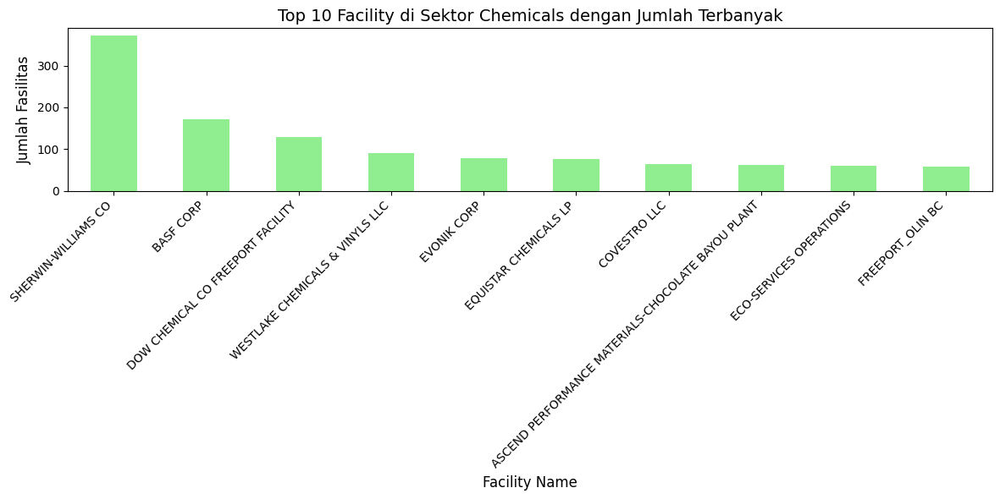

In [ ]:
#filter hanya untuk sektor Chemicals
chemical_data = data[data['23. INDUSTRY SECTOR'] == 'Chemicals']

#hitung jumlah masing-masing fasilitas pada kolom 4. FACILITY NAME
facility_counts = chemical_data['4. FACILITY NAME'].value_counts()

#ambil 10 fasilitas dengan jumlah terbanyak
top10_facilities = facility_counts.head(10)

#plot bar chart
plt.figure(figsize=(12, 6))
top10_facilities.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Facility di Sektor Chemicals dengan Jumlah Terbanyak', fontsize=14)
plt.xlabel('Facility Name', fontsize=12)
plt.ylabel('Jumlah Fasilitas', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Visualisasi top 10 state**

In [ ]:
#membuat DataFrame dari data
df = pd.DataFrame(data_filter_industry_sector)

#memfilter fasilitas yang termasuk dalam sektor 'Chemicals'
chemical_facilities = df[df["23. INDUSTRY SECTOR"] == "Chemicals"]

#menghitung jumlah masing-masing state fasilitas di sektor Chemicals
facility_counts = chemical_facilities['8. ST'].value_counts()

#menampilkan hasil
print("Jumlah state fasilitas di sektor Chemicals untuk masing-masing facility name:")
print(facility_counts)

Jumlah state fasilitas di sektor Chemicals untuk masing-masing facility name:
8. ST
TX    3282
LA    1536
OH    1078
IL     993
CA     638
MI     624
GA     589
IA     574
PA     557
SC     546
NC     479
KY     476
WI     475
TN     475
IN     451
MO     430
AL     412
NJ     319
MN     295
FL     270
KS     264
NY     260
NE     236
WV     234
VA     208
AR     202
MA     193
OK     180
MS     171
CT     147
OR     145
ND     111
CO     103
SD      97
AZ      92
MD      87
PR      75
ID      72
WA      68
UT      56
WY      50
DE      41
NV      38
MT      24
RI      22
NH      21
VT      10
ME       9
NM       5
AK       4
Name: count, dtype: int64


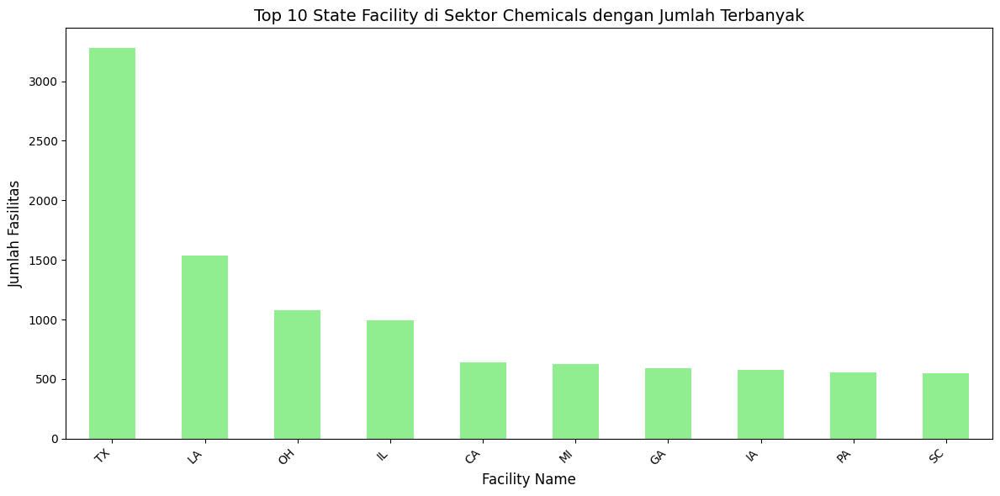

In [ ]:
#filter hanya untuk sektor Chemicals
chemical_data = data[data['23. INDUSTRY SECTOR'] == 'Chemicals']

#hitung jumlah masing-masing fasilitas pada kolom 4. FACILITY NAME
facility_counts = chemical_data['8. ST'].value_counts()

#ambil 10 state fasilitas dengan jumlah terbanyak
top10_facilities = facility_counts.head(10)

#plot bar chart
plt.figure(figsize=(12, 6))
top10_facilities.plot(kind='bar', color='lightgreen')
plt.title('Top 10 State Facility di Sektor Chemicals dengan Jumlah Terbanyak', fontsize=14)
plt.xlabel('Facility Name', fontsize=12)
plt.ylabel('Jumlah Fasilitas', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Visualisasi top 10 facility name berdasarkan state**

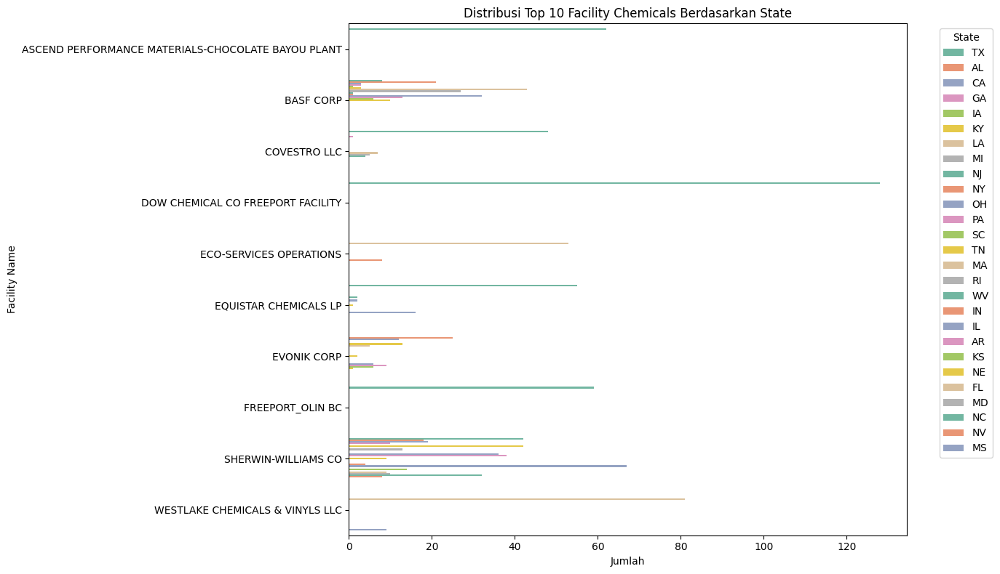

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#daftar Top 10 Facility Name
top_facilities = [
    "SHERWIN-WILLIAMS CO",
    "BASF CORP",
    "DOW CHEMICAL CO FREEPORT FACILITY",
    "WESTLAKE CHEMICALS & VINYLS LLC",
    "EVONIK CORP",
    "EQUISTAR CHEMICALS LP",
    "COVESTRO LLC",
    "ASCEND PERFORMANCE MATERIALS-CHOCOLATE BAYOU PLANT",
    "ECO-SERVICES OPERATIONS",
    "FREEPORT_OLIN BC"
]

#filter hanya sektor Chemicals
chemical_data = data[data['23. INDUSTRY SECTOR'] == 'Chemicals']

#filter hanya 10 fasilitas teratas
filtered_top = chemical_data[chemical_data['4. FACILITY NAME'].isin(top_facilities)]

#hitung jumlah per Facility dan State
facility_state_counts = filtered_top.groupby(['4. FACILITY NAME', '8. ST']).size().reset_index(name='Jumlah')

#plot bar chart
plt.figure(figsize=(14, 8))
sns.barplot(data=facility_state_counts, x='Jumlah', y='4. FACILITY NAME', hue='8. ST', palette='Set2')
plt.title('Distribusi Top 10 Facility Chemicals Berdasarkan State')
plt.xlabel('Jumlah')
plt.ylabel('Facility Name')
plt.legend(title='State', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**Visualisasi distribusi fitur untuk top 10 facility name**

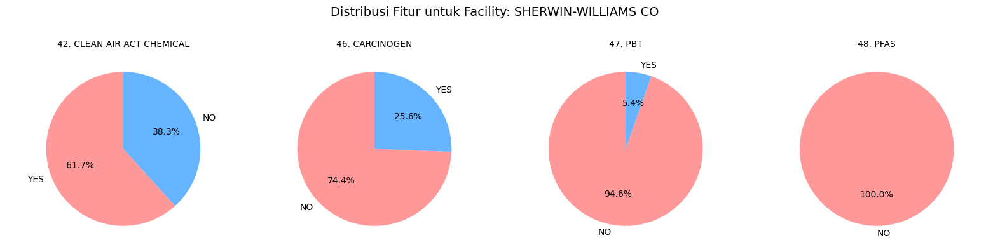

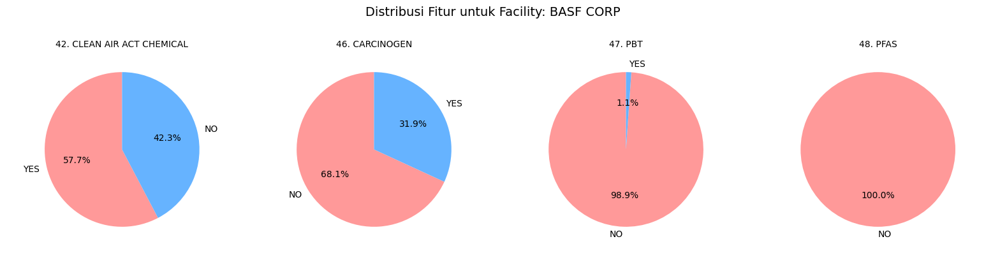

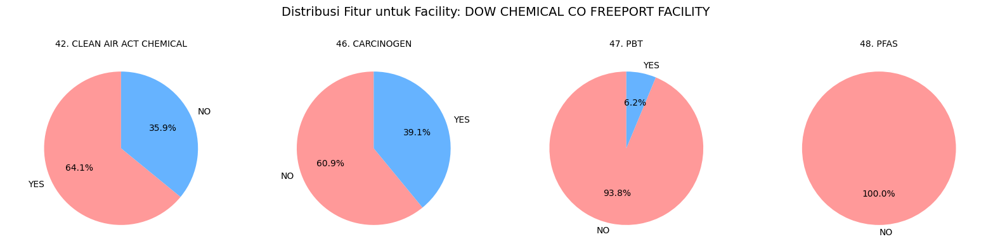

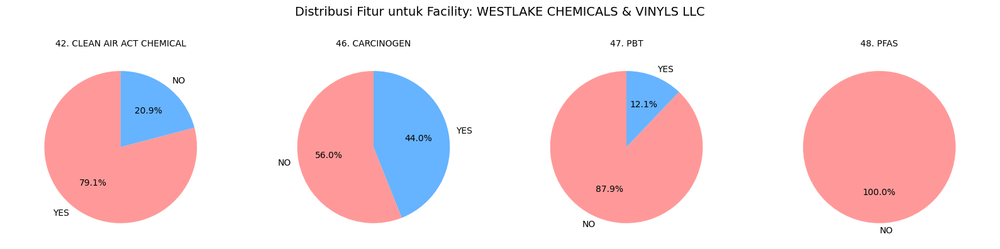

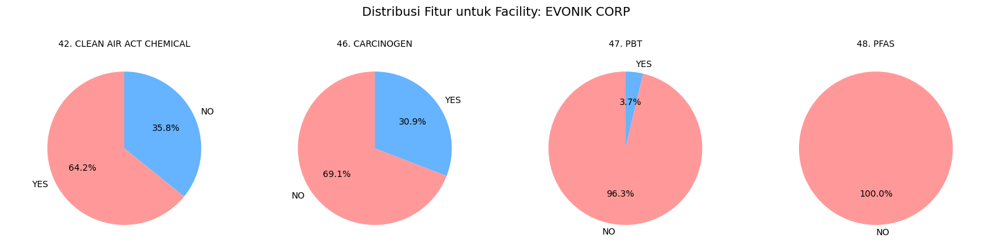

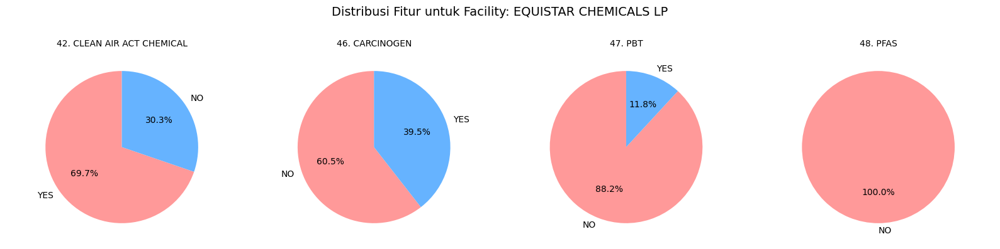

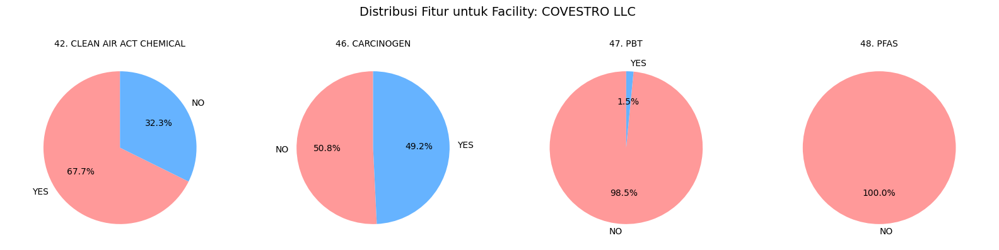

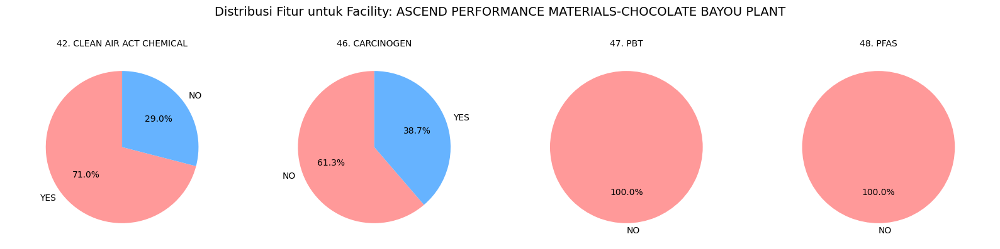

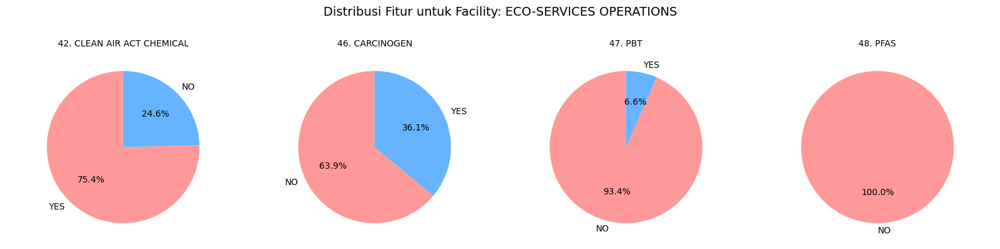

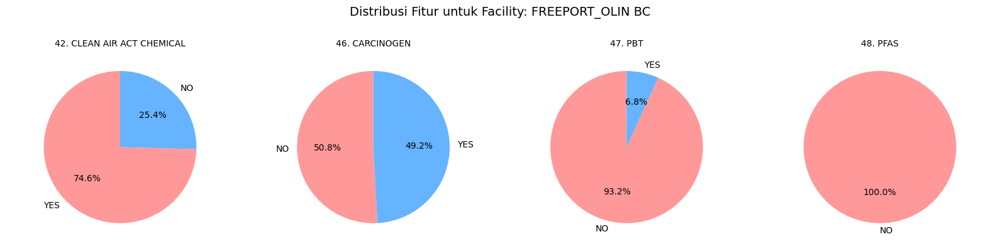

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Bersihkan nama kolom dari spasi berlebih
data.columns = data.columns.str.strip()

#daftar 10 fasilitas teratas
top_facilities = [
    "SHERWIN-WILLIAMS CO",
    "BASF CORP",
    "DOW CHEMICAL CO FREEPORT FACILITY",
    "WESTLAKE CHEMICALS & VINYLS LLC",
    "EVONIK CORP",
    "EQUISTAR CHEMICALS LP",
    "COVESTRO LLC",
    "ASCEND PERFORMANCE MATERIALS-CHOCOLATE BAYOU PLANT",
    "ECO-SERVICES OPERATIONS",
    "FREEPORT_OLIN BC"
]

#kolom yang ingin dianalisis
cols = ['42. CLEAN AIR ACT CHEMICAL', '46. CARCINOGEN', '47. PBT', '48. PFAS']

#loop untuk setiap facility
for facility in top_facilities:
    facility_data = data[data['4. FACILITY NAME'] == facility]

    # Buat subplot pie chart untuk tiap kolom
    fig, axes = plt.subplots(1, len(cols), figsize=(16, 4))
    fig.suptitle(f'Distribusi Fitur untuk Facility: {facility}', fontsize=14)

    for i, col in enumerate(cols):
        counts = facility_data[col].value_counts()
        labels = ['No', 'Yes'] if 0 in counts.index else counts.index.astype(str)
        colors = ['#ff9999','#66b3ff']

        axes[i].pie(
            counts,
            labels=labels,
            autopct='%1.1f%%',
            startangle=90,
            colors=colors
        )
        axes[i].set_title(col, fontsize=10)
        axes[i].axis('equal')

    plt.tight_layout()
    plt.subplots_adjust(top=0.8)
    plt.show()

**Visualisasi top 10 facility name berdasarkan chemical**

In [ ]:
#menghitung jumlah setiap chemical
chemical_counts = data['37. CHEMICAL'].value_counts().reset_index()
chemical_counts.columns = ['CHEMICAL', 'JUMLAH']
print(chemical_counts)

                                              CHEMICAL  JUMLAH
0                                                 Lead    4064
1                                       Zinc compounds    2852
2                                               Nickel    2526
3                                             Chromium    2489
4                                               Copper    2377
5    Nitrate compounds (water dissociable; reportab...    2321
6                                            Manganese    2309
7                                             Methanol    2235
8                                              Toluene    2192
9                                              Ammonia    2181
10                            Lead  And Lead Compounds    2075
11                              Xylene (mixed isomers)    2032
12                                         Nitric acid    1639
13                       Polycyclic aromatic compounds    1575
14                                            n-Hexane 

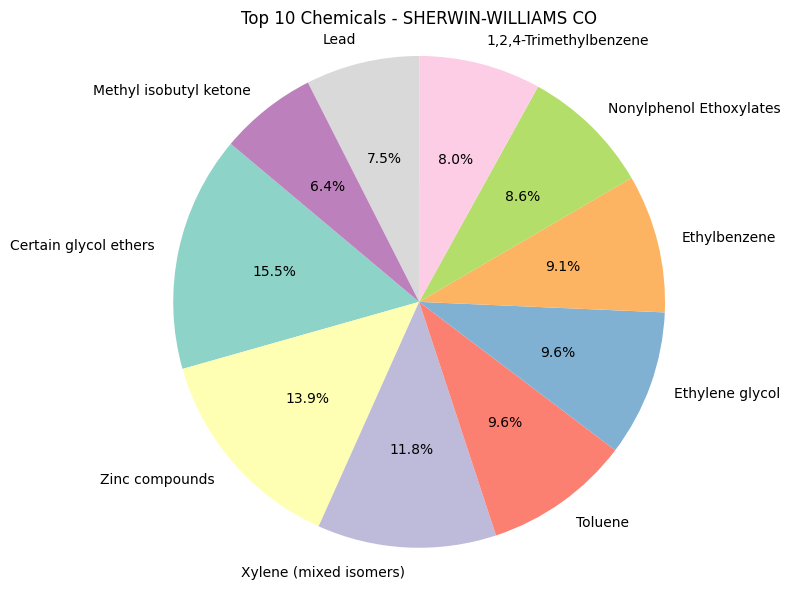

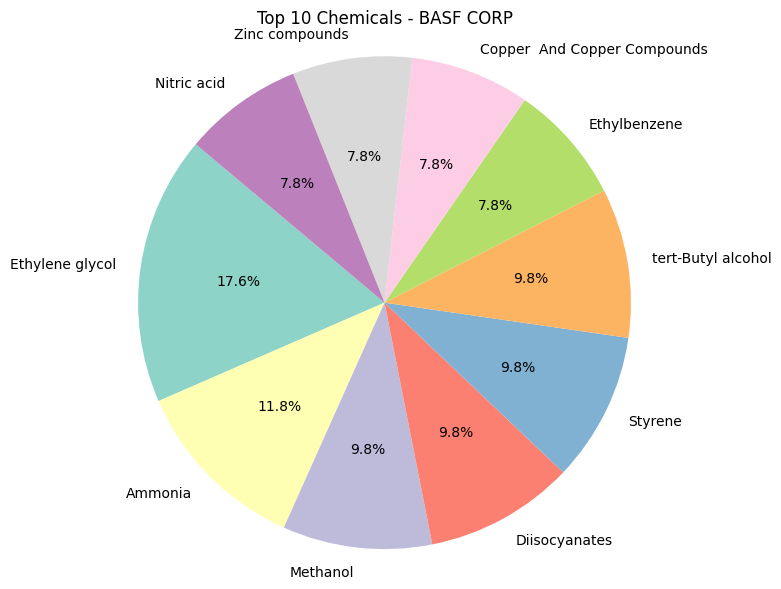

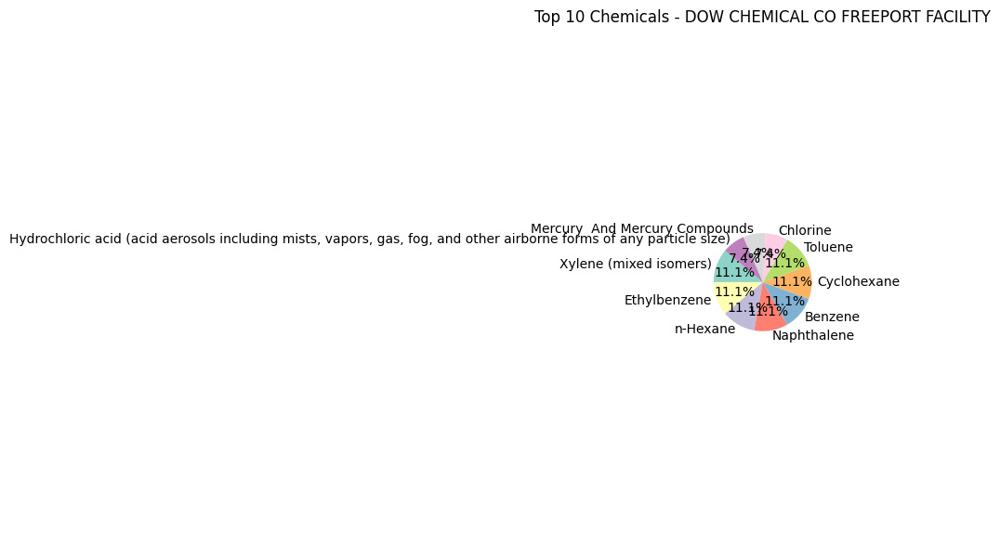

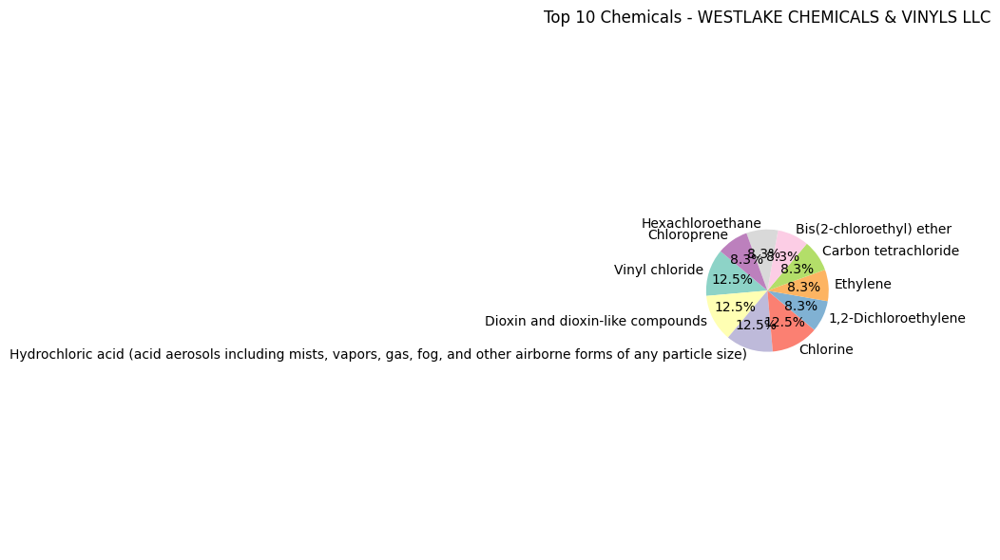

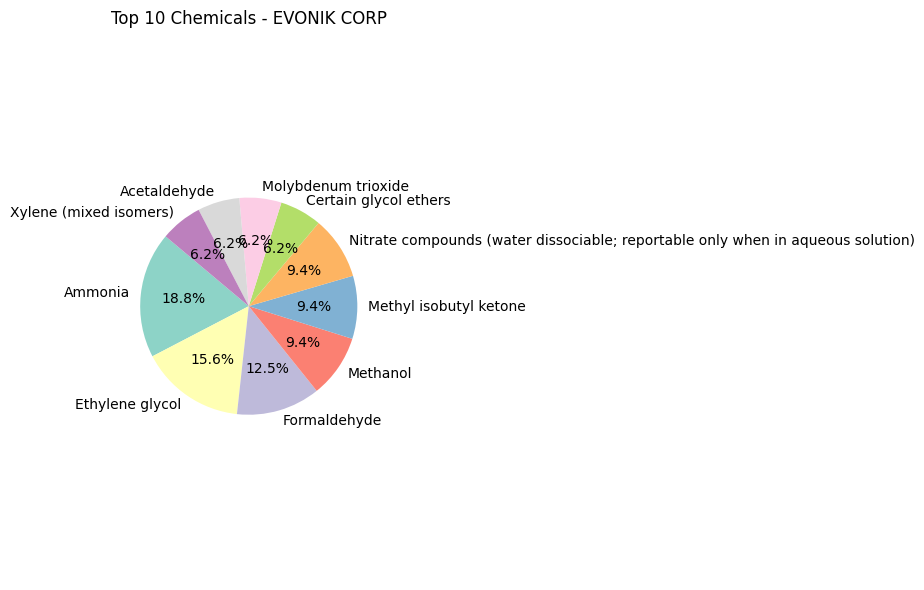

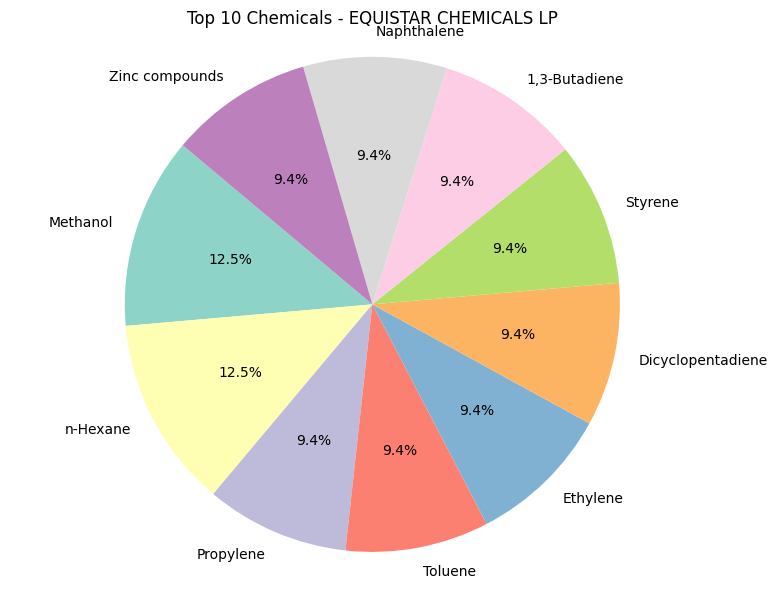

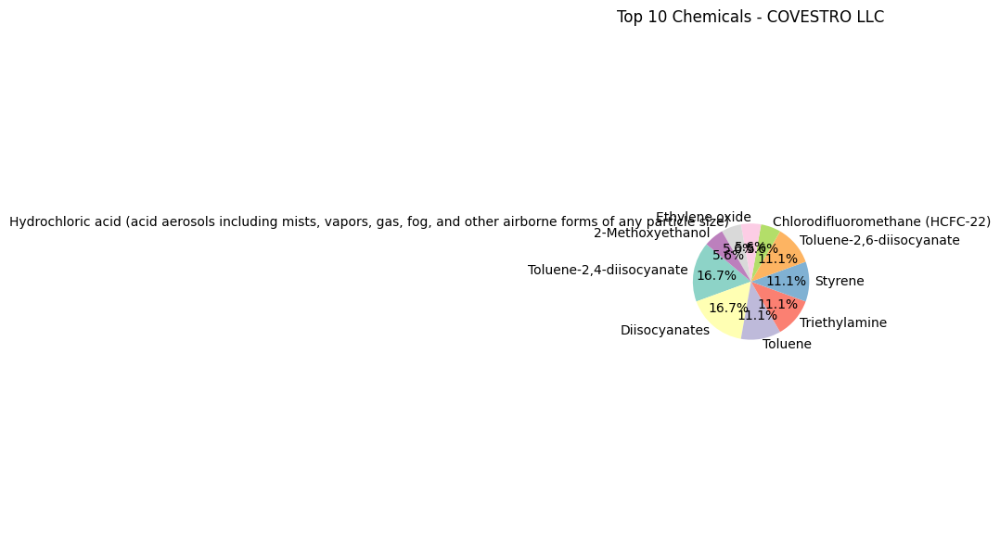

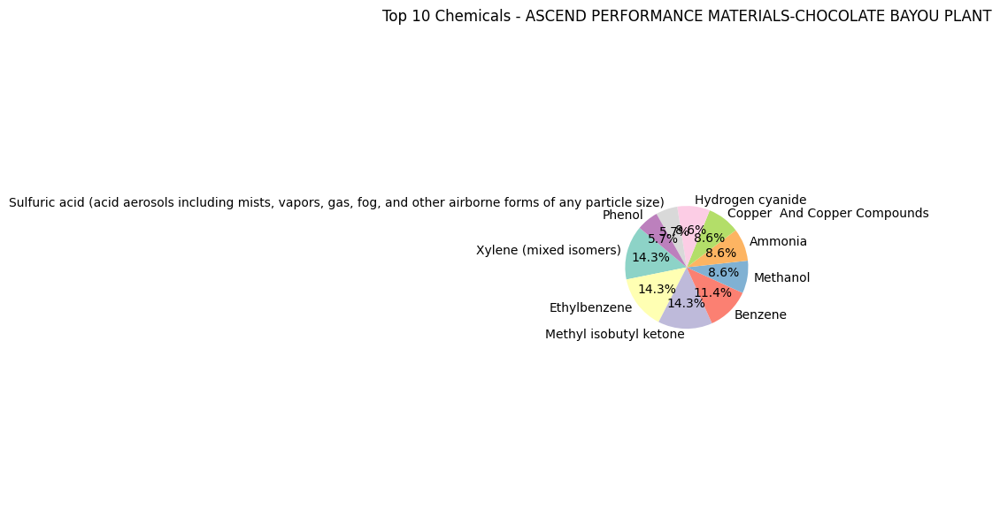

<ipython-input-17-a33ed143f730>:47: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


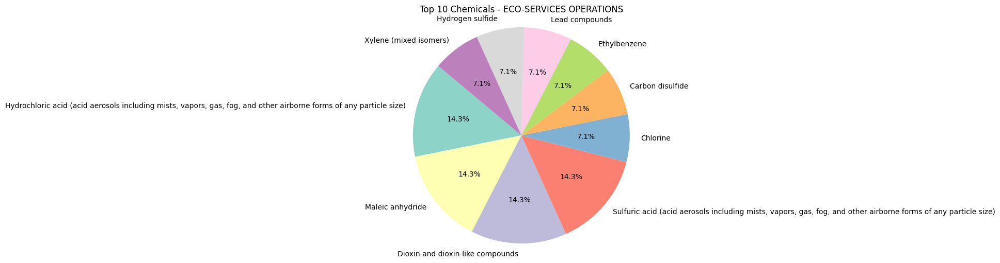

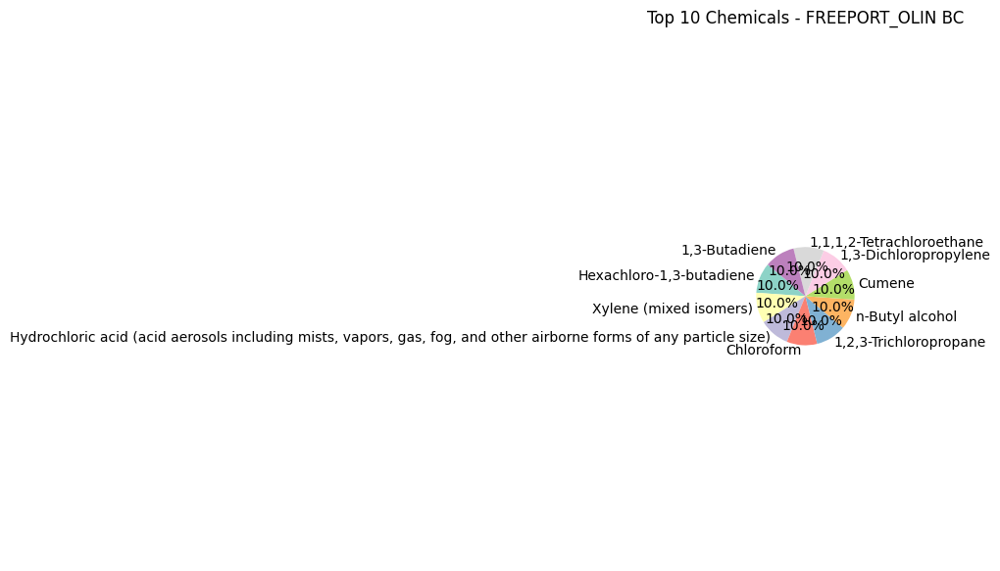

In [ ]:
import matplotlib.pyplot as plt

# Pastikan kolom bersih dari spasi berlebih
data.columns = data.columns.str.strip()

#daftar top 10 facility
top_facilities = [
    "SHERWIN-WILLIAMS CO",
    "BASF CORP",
    "DOW CHEMICAL CO FREEPORT FACILITY",
    "WESTLAKE CHEMICALS & VINYLS LLC",
    "EVONIK CORP",
    "EQUISTAR CHEMICALS LP",
    "COVESTRO LLC",
    "ASCEND PERFORMANCE MATERIALS-CHOCOLATE BAYOU PLANT",
    "ECO-SERVICES OPERATIONS",
    "FREEPORT_OLIN BC"
]

#nama kolom yang digunakan
facility_col = '4. FACILITY NAME'
chemical_col = '37. CHEMICAL'

#loop untuk setiap facility dan tampilkan pie chart chemical-nya
for facility in top_facilities:
    facility_data = data[data[facility_col] == facility]

    # Hitung 10 chemical terbanyak di fasilitas ini
    top_chemicals = facility_data[chemical_col].value_counts().head(10)

    # Jika datanya kosong, lewati
    if top_chemicals.empty:
        print(f"Tidak ada data untuk {facility}")
        continue

    # Plot pie chart
    plt.figure(figsize=(8, 6))
    plt.pie(
        top_chemicals,
        labels=top_chemicals.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=plt.cm.Set3.colors
    )
    plt.title(f'Top 10 Chemicals - {facility}', fontsize=12)
    plt.axis('equal')
    plt.tight_layout()
    plt.show()


**Visualisasi top 10 facility name berdasarkan metode pengolahan**



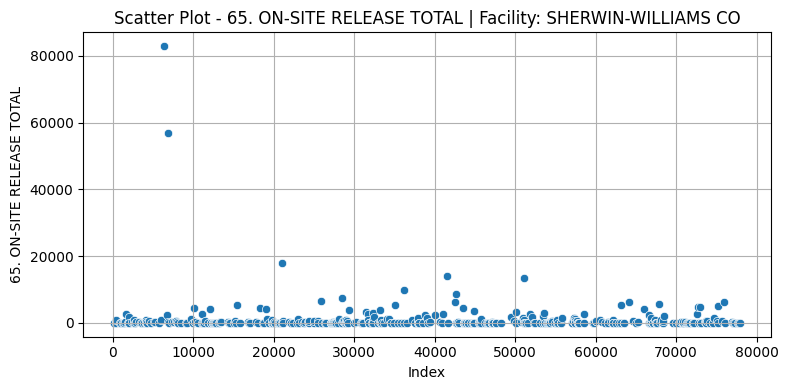

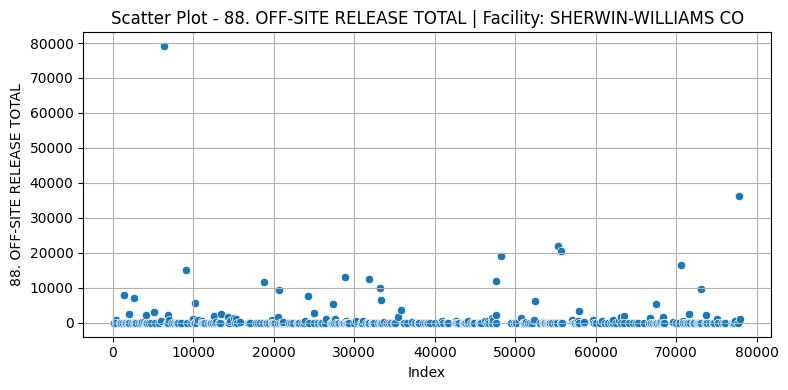

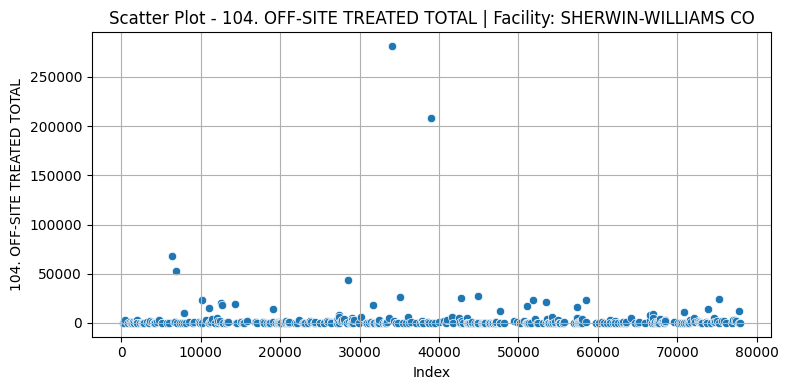

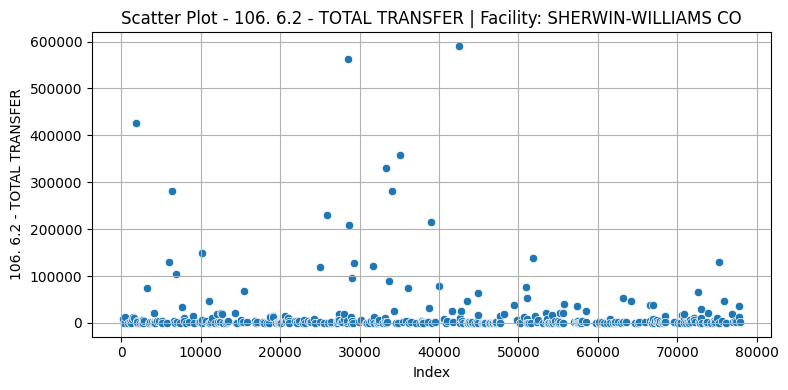

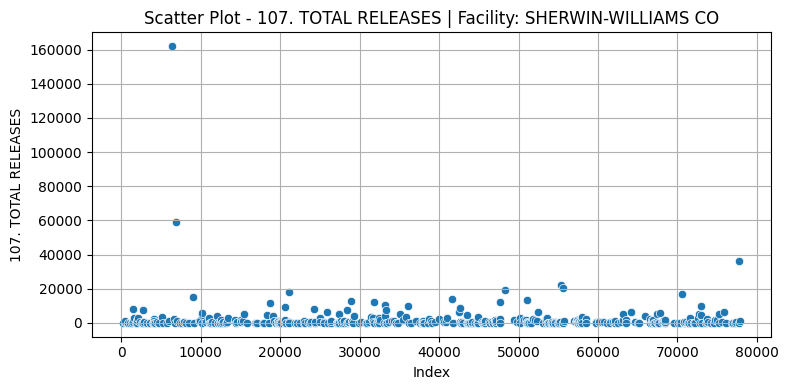

...

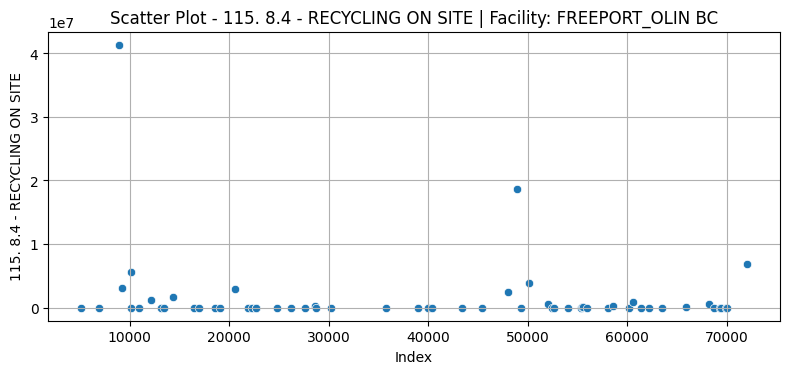

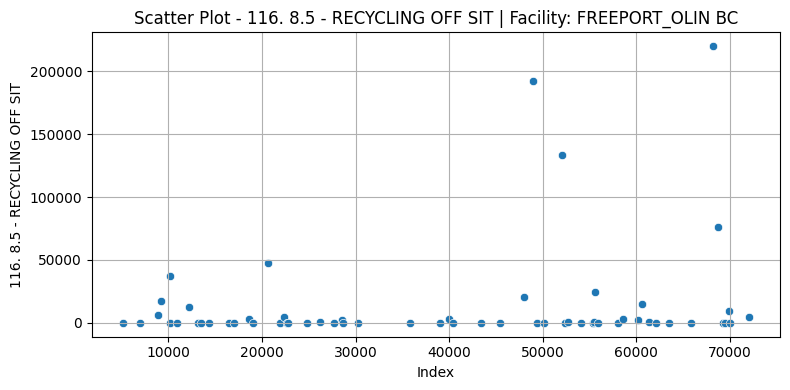

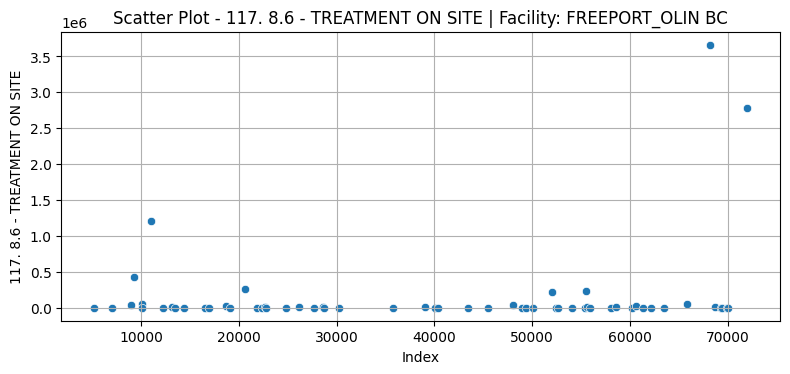

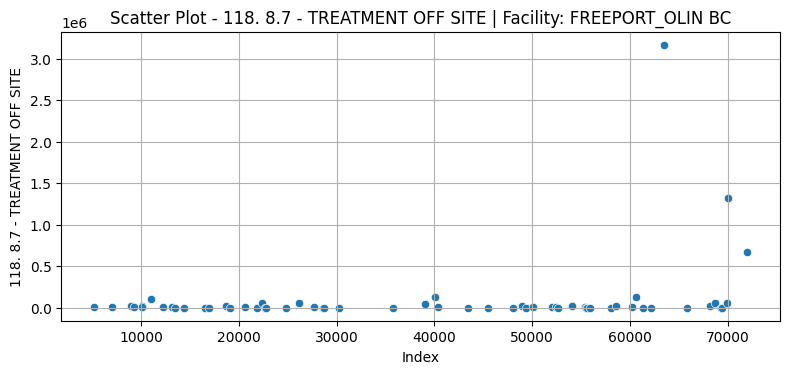

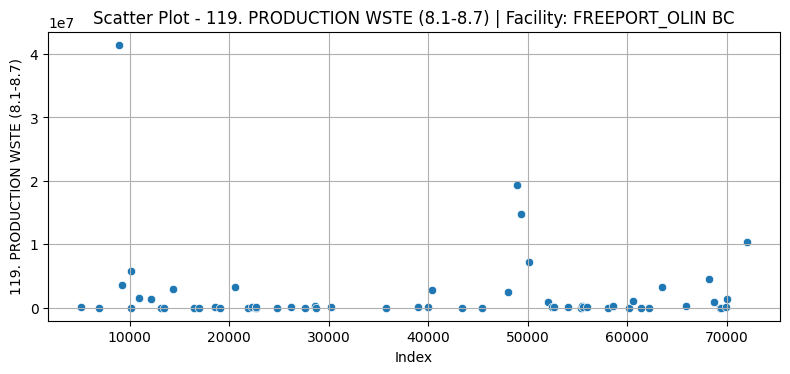

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#daftar top facilities
top_facilities = [
    "SHERWIN-WILLIAMS CO",
    "BASF CORP",
    "DOW CHEMICAL CO FREEPORT FACILITY",
    "WESTLAKE CHEMICALS & VINYLS LLC",
    "EVONIK CORP",
    "EQUISTAR CHEMICALS LP",
    "COVESTRO LLC",
    "ASCEND PERFORMANCE MATERIALS-CHOCOLATE BAYOU PLANT",
    "ECO-SERVICES OPERATIONS",
    "FREEPORT_OLIN BC"
]

#daftar fitur numerik yang ingin dianalisis
fitur_terpilih = [
    '65. ON-SITE RELEASE TOTAL',
    '88. OFF-SITE RELEASE TOTAL',
    '104. OFF-SITE TREATED TOTAL',
    '106. 6.2 - TOTAL TRANSFER',
    '107. TOTAL RELEASES',
    '115. 8.4 - RECYCLING ON SITE',
    '116. 8.5 - RECYCLING OFF SIT',
    '117. 8.6 - TREATMENT ON SITE',
    '118. 8.7 - TREATMENT OFF SITE',
    '119. PRODUCTION WSTE (8.1-8.7)'
]

#plot scatter untuk setiap facility dan setiap fitur
for facility in top_facilities:
    data_fasilitas = data[data['4. FACILITY NAME'] == facility]  # Ganti 'Facility' jika nama kolom berbeda
    for fitur in fitur_terpilih:
        if fitur in data_fasilitas.columns:
            plt.figure(figsize=(8, 4))
            sns.scatterplot(x=data_fasilitas.index, y=data_fasilitas[fitur])
            plt.title(f'Scatter Plot - {fitur} | Facility: {facility}')
            plt.xlabel('Index')
            plt.ylabel(fitur)
            plt.grid(True)
            plt.tight_layout()
            plt.show()
        else:
            print(f"Fitur '{fitur}' tidak ditemukan di data.")
